# Phone Addiction Project

## Project Objective
* Data collection and loading
* Initial data inspection
* Data cleaning
* Exploratory Data Analysis (EDA)
* Outlier detection and treatment
* Feature encoding
* Feature scaling
* Train-test split

# Step1:Data collection and loading

In [218]:
# loading Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

In [219]:
#Load Dataset
df = pd.read_csv(r"C:\Users\abhin\Downloads\phone_addiction_dataset.csv")

* pd.read_csv() is used to load CSV file
* Data is stored inside dataframe df

In [220]:
df

,Name,Age,Gender,Location,Daily_Usage_Hours,Sleep_Hours,Interllectual_Performance,Social_Interactions,Exercise_Hours,Anxiety_Level,...,Screen_Time_Before_Bed,Phone_Checks_Per_Day,Apps_Used_Daily,Time_on_Social_Media,Time_on_Gaming,Time_on_Education,Phone_Usage_Purpose,Family_Communication,Weekend_Usage_Hours,Addiction_Level
0,Shannon Francis,13,Female,Hansonfort,4.0,6.1,78,5,0.1,10,...,1.4,86,19,3.6,1.7,1.2,Browsing,4,8.7,10.0
1,Scott Rodriguez,17,Female,Theodorefort,5.5,6.5,70,5,0.0,3,...,0.9,96,9,1.1,4.0,1.8,Browsing,2,5.3,10.0
2,Adrian Knox,13,Other,Lindseystad,5.8,5.5,93,8,0.8,2,...,0.5,137,8,0.3,1.5,0.4,Education,6,5.7,9.2
3,Brittany Hamilton,18,Female,West Anthony,3.1,3.9,78,8,1.6,9,...,1.4,128,7,3.1,1.6,0.8,Social Media,8,3.0,9.8
4,Steven Smith,14,Other,Port Lindsaystad,2.5,6.7,56,4,1.1,1,...,1.0,96,20,2.6,0.9,1.1,Gaming,10,3.7,8.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,Jesus Yates,38,Female,New Jennifer,3.9,6.4,53,4,0.9,7,...,0.3,80,15,2.7,1.8,1.0,Other,8,9.4,9.8
5996,Bethany Murray,80,Female,Richardport,3.6,7.3,93,5,0.0,8,...,0.9,45,8,3.1,0.0,0.3,Gaming,9,5.2,5.5
5997,Norman Hughes,21,Other,Rebeccaton,3.2,6.5,98,1,0.0,4,...,0.2,51,13,2.4,0.2,2.4,Social Media,9,5.9,6.2
5998,Barbara Hinton,29,Female,Ramirezmouth,6.7,7.5,67,3,0.2,3,...,1.6,125,17,1.7,2.6,1.5,Browsing,4,6.1,10.0


### Validate Dataset Structure

In [221]:
# Check number of rows and columns
df.shape

(6000, 22)

In [222]:
# Display all column names
df.columns

Index(['Name', 'Age', 'Gender', 'Location', 'Daily_Usage_Hours', 'Sleep_Hours',
       'Interllectual_Performance', 'Social_Interactions', 'Exercise_Hours',
       'Anxiety_Level', 'Depression_Level', 'Self_Esteem',
       'Screen_Time_Before_Bed', 'Phone_Checks_Per_Day', 'Apps_Used_Daily',
       'Time_on_Social_Media', 'Time_on_Gaming', 'Time_on_Education',
       'Phone_Usage_Purpose', 'Family_Communication', 'Weekend_Usage_Hours',
       'Addiction_Level'],
      dtype='object')

In [223]:
#Display first 5 rows
df.head()

,Name,Age,Gender,Location,Daily_Usage_Hours,Sleep_Hours,Interllectual_Performance,Social_Interactions,Exercise_Hours,Anxiety_Level,...,Screen_Time_Before_Bed,Phone_Checks_Per_Day,Apps_Used_Daily,Time_on_Social_Media,Time_on_Gaming,Time_on_Education,Phone_Usage_Purpose,Family_Communication,Weekend_Usage_Hours,Addiction_Level
0,Shannon Francis,13,Female,Hansonfort,4.0,6.1,78,5,0.1,10,...,1.4,86,19,3.6,1.7,1.2,Browsing,4,8.7,10.0
1,Scott Rodriguez,17,Female,Theodorefort,5.5,6.5,70,5,0.0,3,...,0.9,96,9,1.1,4.0,1.8,Browsing,2,5.3,10.0
2,Adrian Knox,13,Other,Lindseystad,5.8,5.5,93,8,0.8,2,...,0.5,137,8,0.3,1.5,0.4,Education,6,5.7,9.2
3,Brittany Hamilton,18,Female,West Anthony,3.1,3.9,78,8,1.6,9,...,1.4,128,7,3.1,1.6,0.8,Social Media,8,3.0,9.8
4,Steven Smith,14,Other,Port Lindsaystad,2.5,6.7,56,4,1.1,1,...,1.0,96,20,2.6,0.9,1.1,Gaming,10,3.7,8.6


### Shape
* 6000 Rows
* 22 Columns
### Columns Names
### Display all column names
* feature names
* target column
* categorical columns
### Head
* Display first 5 rows
### Used To
* check dataset structure
* understand columns
* verify successful loading

# Step 2: Initial Data Inspection

In [224]:
df.head()
df.tail()

,Name,Age,Gender,Location,Daily_Usage_Hours,Sleep_Hours,Interllectual_Performance,Social_Interactions,Exercise_Hours,Anxiety_Level,...,Screen_Time_Before_Bed,Phone_Checks_Per_Day,Apps_Used_Daily,Time_on_Social_Media,Time_on_Gaming,Time_on_Education,Phone_Usage_Purpose,Family_Communication,Weekend_Usage_Hours,Addiction_Level
5995,Jesus Yates,38,Female,New Jennifer,3.9,6.4,53,4,0.9,7,...,0.3,80,15,2.7,1.8,1.0,Other,8,9.4,9.8
5996,Bethany Murray,80,Female,Richardport,3.6,7.3,93,5,0.0,8,...,0.9,45,8,3.1,0.0,0.3,Gaming,9,5.2,5.5
5997,Norman Hughes,21,Other,Rebeccaton,3.2,6.5,98,1,0.0,4,...,0.2,51,13,2.4,0.2,2.4,Social Media,9,5.9,6.2
5998,Barbara Hinton,29,Female,Ramirezmouth,6.7,7.5,67,3,0.2,3,...,1.6,125,17,1.7,2.6,1.5,Browsing,4,6.1,10.0
5999,Curtis Johnson,31,Male,Lake Alexander,3.5,6.9,79,4,2.1,4,...,0.6,117,8,0.0,2.3,0.1,Education,7,5.1,6.3


In [225]:
#Get dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Name                       6000 non-null   object 
 1   Age                        6000 non-null   int64  
 2   Gender                     6000 non-null   object 
 3   Location                   6000 non-null   object 
 4   Daily_Usage_Hours          6000 non-null   float64
 5   Sleep_Hours                6000 non-null   float64
 6   Interllectual_Performance  6000 non-null   int64  
 7   Social_Interactions        6000 non-null   int64  
 8   Exercise_Hours             6000 non-null   float64
 9   Anxiety_Level              6000 non-null   int64  
 10  Depression_Level           6000 non-null   int64  
 11  Self_Esteem                6000 non-null   int64  
 12  Screen_Time_Before_Bed     6000 non-null   float64
 13  Phone_Checks_Per_Day       6000 non-null   int64

### Shows:
* column names
* data types
* null values
* memory usage

In [226]:
# Statistical analysis
df.describe()

,Age,Daily_Usage_Hours,Sleep_Hours,Interllectual_Performance,Social_Interactions,Exercise_Hours,Anxiety_Level,Depression_Level,Self_Esteem,Screen_Time_Before_Bed,Phone_Checks_Per_Day,Apps_Used_Daily,Time_on_Social_Media,Time_on_Gaming,Time_on_Education,Family_Communication,Weekend_Usage_Hours,Addiction_Level
count,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000
mean,33.658667,5.020667,6.489767,74.947333,5.097667,1.040667,5.590000,5.460333,5.546333,1.006733,83.093000,12.609333,2.499233,1.525267,1.016333,5.459667,6.015100,8.881900
std,26.891517,1.956338,1.490589,14.682932,3.139072,0.734558,2.890437,2.871318,2.860516,0.492837,37.743897,4.611101,0.988119,0.932623,0.648287,2.864334,2.014608,1.609464
min,2.000000,0.000000,3.000000,50.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,20.000000,5.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,15.000000,3.700000,5.500000,62.000000,2.000000,0.500000,3.000000,3.000000,3.000000,0.700000,51.000000,9.000000,1.800000,0.800000,0.500000,3.000000,4.700000,8.000000
50%,18.000000,5.000000,6.500000,75.000000,5.000000,1.000000,6.000000,5.000000,6.000000,1.000000,82.000000,13.000000,2.500000,1.500000,1.000000,5.000000,6.000000,10.000000
75%,52.000000,6.400000,7.500000,88.000000,8.000000,1.500000,8.000000,8.000000,8.000000,1.400000,115.250000,17.000000,3.200000,2.200000,1.500000,8.000000,7.400000,10.000000
max,100.000000,11.500000,10.000000,100.000000,10.000000,4.000000,10.000000,10.000000,10.000000,2.600000,150.000000,20.000000,5.000000,4.000000,3.000000,10.000000,14.000000,10.000000


### Shows
* mean
* minimum
* maximum
* standard deviation
Useful for numerical columns.

In [227]:
# Check missing values
df.isnull().sum()

Name                         0
Age                          0
Gender                       0
Location                     0
Daily_Usage_Hours            0
Sleep_Hours                  0
Interllectual_Performance    0
Social_Interactions          0
Exercise_Hours               0
Anxiety_Level                0
Depression_Level             0
Self_Esteem                  0
Screen_Time_Before_Bed       0
Phone_Checks_Per_Day         0
Apps_Used_Daily              0
Time_on_Social_Media         0
Time_on_Gaming               0
Time_on_Education            0
Phone_Usage_Purpose          0
Family_Communication         0
Weekend_Usage_Hours          0
Addiction_Level              0
dtype: int64

### Used To identify
* empty cells
* incomplete data

In [228]:
df.columns

Index(['Name', 'Age', 'Gender', 'Location', 'Daily_Usage_Hours', 'Sleep_Hours',
       'Interllectual_Performance', 'Social_Interactions', 'Exercise_Hours',
       'Anxiety_Level', 'Depression_Level', 'Self_Esteem',
       'Screen_Time_Before_Bed', 'Phone_Checks_Per_Day', 'Apps_Used_Daily',
       'Time_on_Social_Media', 'Time_on_Gaming', 'Time_on_Education',
       'Phone_Usage_Purpose', 'Family_Communication', 'Weekend_Usage_Hours',
       'Addiction_Level'],
      dtype='object')

## Unique Values

In [229]:
## Check unique values in every column
for col in df.columns:
    print(col, df[col].nunique())

Name 2933
Age 99
Gender 3
Location 2726
Daily_Usage_Hours 107
Sleep_Hours 71
Interllectual_Performance 51
Social_Interactions 11
Exercise_Hours 39
Anxiety_Level 10
Depression_Level 10
Self_Esteem 10
Screen_Time_Before_Bed 27
Phone_Checks_Per_Day 131
Apps_Used_Daily 16
Time_on_Social_Media 51
Time_on_Gaming 41
Time_on_Education 31
Phone_Usage_Purpose 5
Family_Communication 10
Weekend_Usage_Hours 120
Addiction_Level 80


### Helps To identify
* categorical variables
* unnecessary columns

In [230]:
df.dtypes

Name                          object
Age                            int64
Gender                        object
Location                      object
Daily_Usage_Hours            float64
Sleep_Hours                  float64
Interllectual_Performance      int64
Social_Interactions            int64
Exercise_Hours               float64
Anxiety_Level                  int64
Depression_Level               int64
Self_Esteem                    int64
Screen_Time_Before_Bed       float64
Phone_Checks_Per_Day           int64
Apps_Used_Daily                int64
Time_on_Social_Media         float64
Time_on_Gaming               float64
Time_on_Education            float64
Phone_Usage_Purpose           object
Family_Communication           int64
Weekend_Usage_Hours          float64
Addiction_Level              float64
dtype: object

In [231]:
# Check duplicate rows
df.duplicated().sum()

np.int64(32)

# Step 3: Data Cleaning

### Handle Missing Values

In [232]:
# Remove duplicate rows
df.drop_duplicates(inplace=True)

### Explanation
* Removes repeated records

In [233]:
df.duplicated().sum()

np.int64(0)

# Step 4: Exploratory Data Analysis

## Univariate Analysis

In [234]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5968 entries, 0 to 5999
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Name                       5968 non-null   object 
 1   Age                        5968 non-null   int64  
 2   Gender                     5968 non-null   object 
 3   Location                   5968 non-null   object 
 4   Daily_Usage_Hours          5968 non-null   float64
 5   Sleep_Hours                5968 non-null   float64
 6   Interllectual_Performance  5968 non-null   int64  
 7   Social_Interactions        5968 non-null   int64  
 8   Exercise_Hours             5968 non-null   float64
 9   Anxiety_Level              5968 non-null   int64  
 10  Depression_Level           5968 non-null   int64  
 11  Self_Esteem                5968 non-null   int64  
 12  Screen_Time_Before_Bed     5968 non-null   float64
 13  Phone_Checks_Per_Day       5968 non-null   int64  
 1

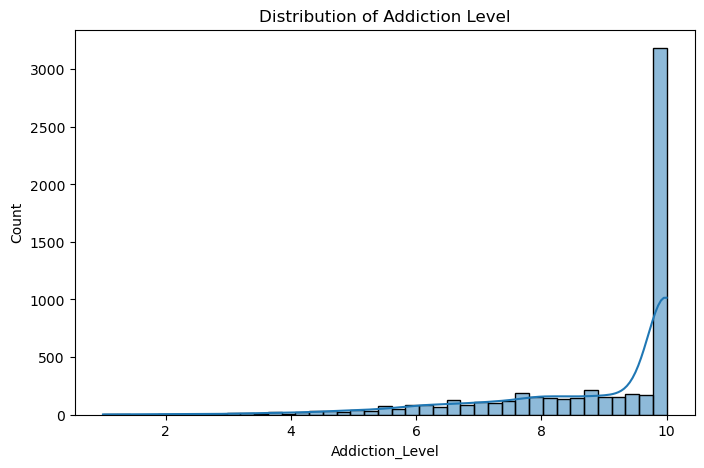

In [235]:
## Plot distribution graph
plt.figure(figsize=(8,5))
sns.histplot(df['Addiction_Level'], kde=True)
plt.title('Distribution of Addiction Level')
plt.show()

### Insight:
* Helps identify whether addiction levels are normally distributed or skewed

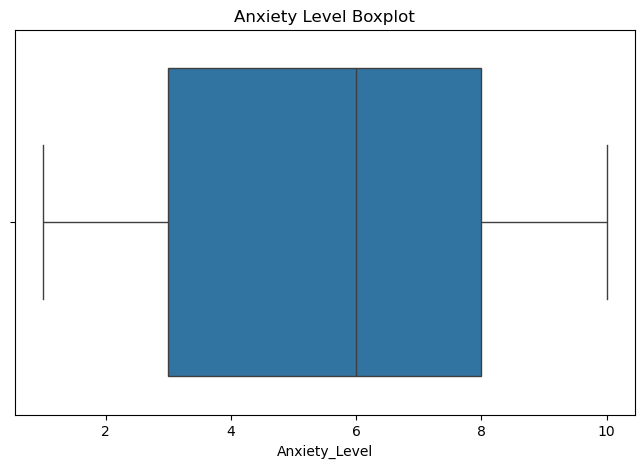

In [236]:
#Boxplot
plt.figure(figsize=(8,5))
sns.boxplot(x=df['Anxiety_Level'])
plt.title('Anxiety Level Boxplot')
plt.show()

### Insight:
* Detect outliers
* Understand spread

##  Bivariate Analysis

### Daily Usage Hours vs Addiction Level

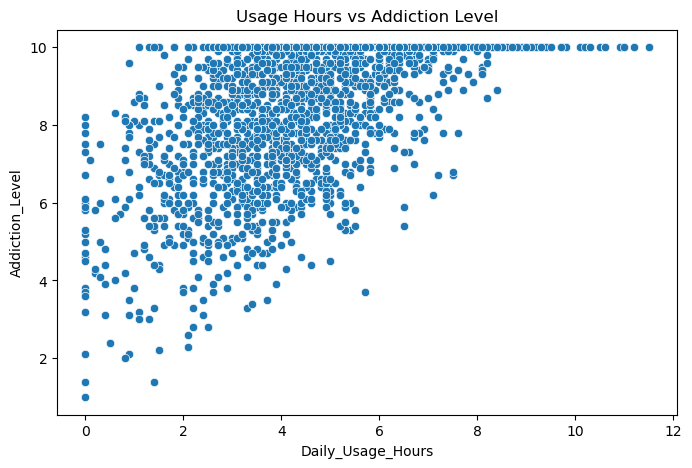

In [237]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='Daily_Usage_Hours', y='Addiction_Level', data=df)
plt.title('Usage Hours vs Addiction Level')
plt.show()

### Insight:
* Positive relationship expected between usage and addiction

### Anxiety Level vs Addiction Level

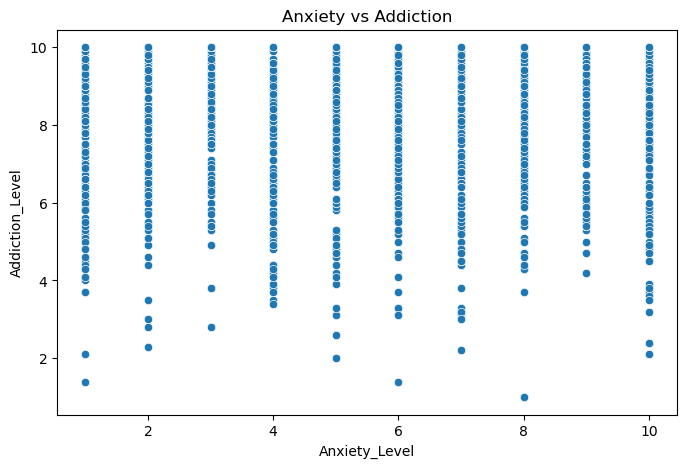

In [238]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='Anxiety_Level', y='Addiction_Level', data=df)
plt.title('Anxiety vs Addiction')
plt.show()

### Insight:
* Higher anxiety may correlate with higher addiction.

### Correlation Analysis

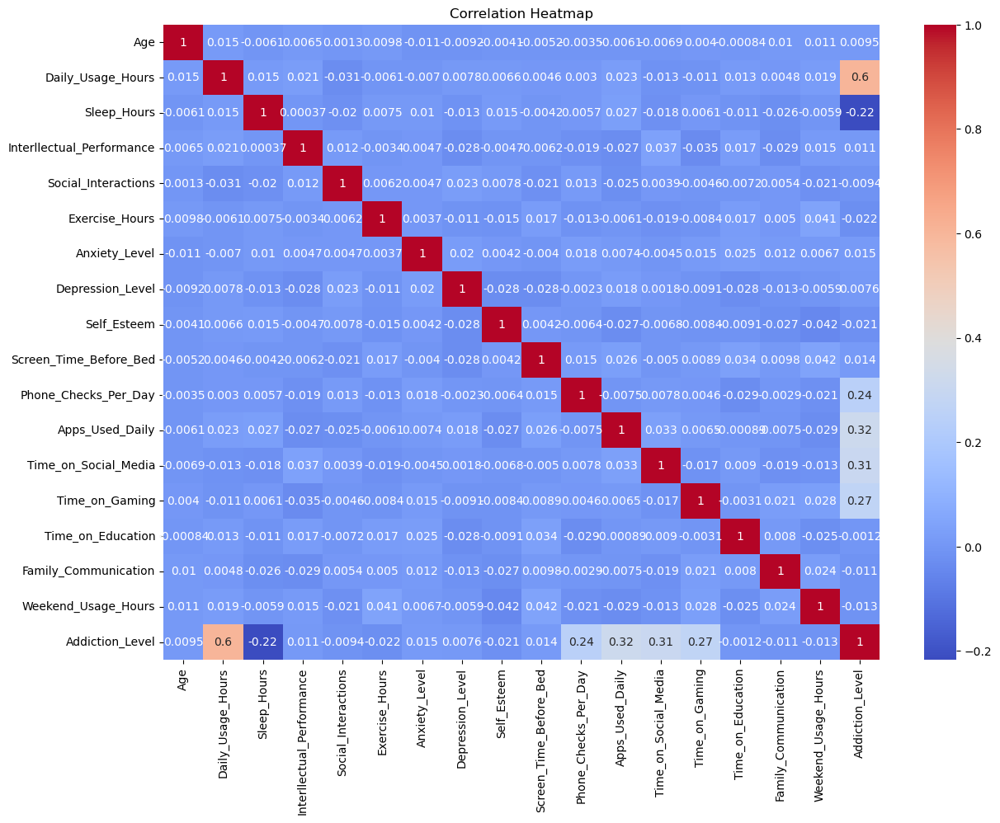

In [239]:
numeric_df = df.select_dtypes(include=np.number)

corr = numeric_df.corr()

plt.figure(figsize=(14,10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

### Observations:
* Daily usage hours strongly influence addiction level
* Sleep hours may show negative correlation
* Anxiety and depression positively correlate with addiction

##  Multivariate Analysis

In [243]:
selected_cols=df.select_dtypes(include='number').columns

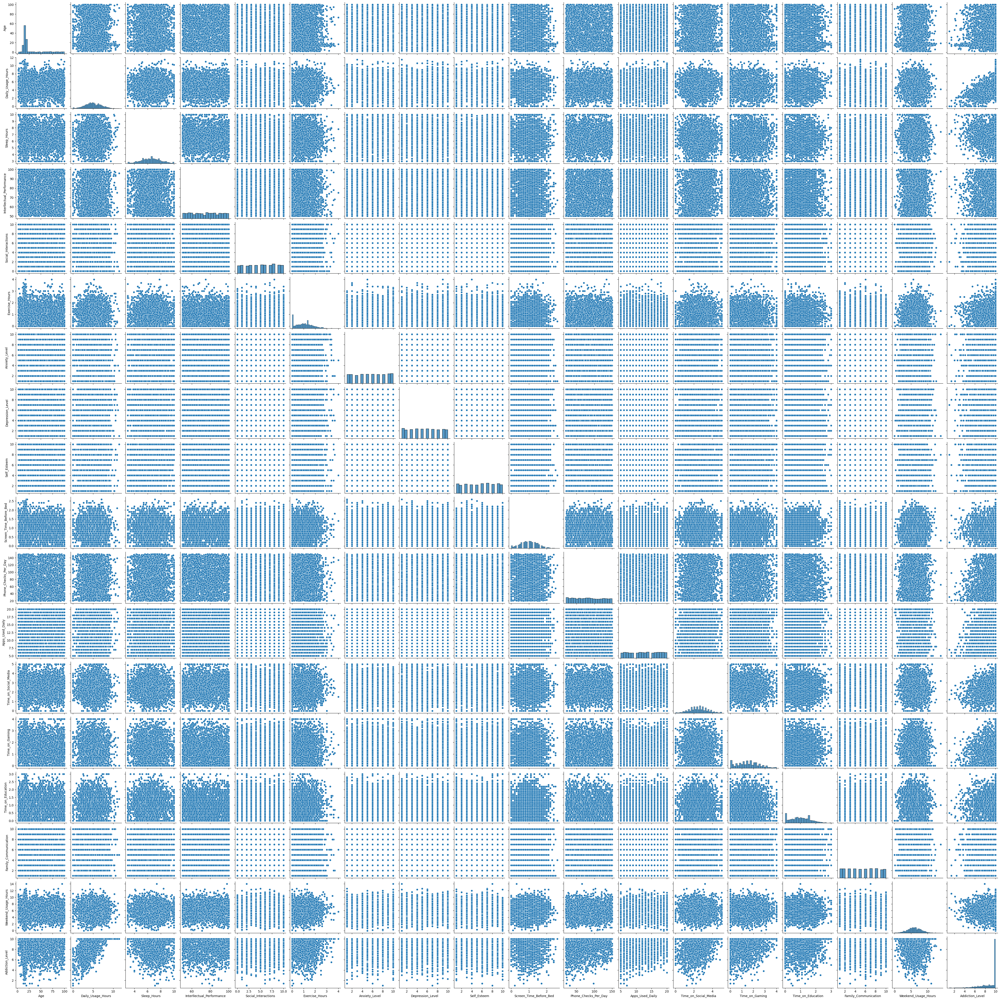

In [244]:
sns.pairplot(df[selected_cols])
plt.show()

### Purpose:
* Analyze interaction between multiple variables.

### Addiction Level by Gender

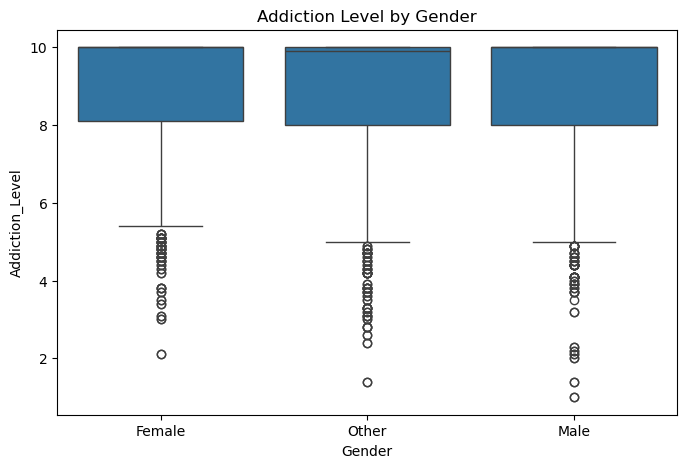

In [245]:
plt.figure(figsize=(8,5))
sns.boxplot(x='Gender', y='Addiction_Level', data=df)
plt.title('Addiction Level by Gender')
plt.show()

### Insight:
* Helps compare addiction trends across genders.

# Step 5: Outlier Detection & Treatment

## Boxplot Method

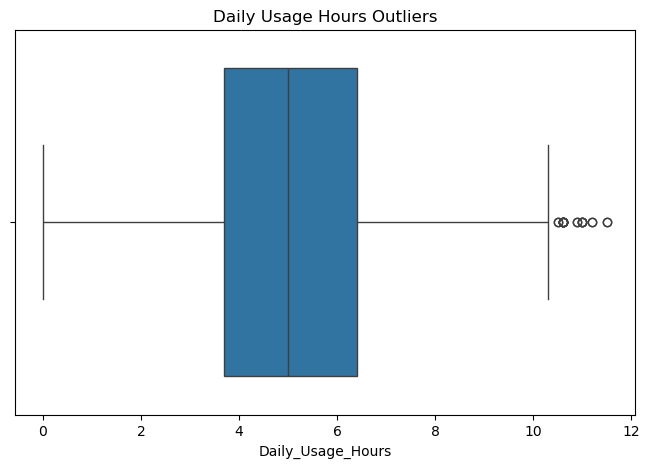

In [246]:
plt.figure(figsize=(8,5))
sns.boxplot(x=df['Daily_Usage_Hours'])
plt.title('Daily Usage Hours Outliers')
plt.show()

## IQR Method

In [247]:
Q1 = df['Daily_Usage_Hours'].quantile(0.25)
Q3 = df['Daily_Usage_Hours'].quantile(0.75)
IQR = Q3 - Q1

lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

filtered_df = df[(df['Daily_Usage_Hours'] >= lower) &
                 (df['Daily_Usage_Hours'] <= upper)]

## Capping Outliers

In [248]:
df['Daily_Usage_Hours'] = np.where(
    df['Daily_Usage_Hours'] > upper,
    upper,
    df['Daily_Usage_Hours']
)

# Step 6: Feature Encoding

## Label Encoding

In [249]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5968 entries, 0 to 5999
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Name                       5968 non-null   object 
 1   Age                        5968 non-null   int64  
 2   Gender                     5968 non-null   object 
 3   Location                   5968 non-null   object 
 4   Daily_Usage_Hours          5968 non-null   float64
 5   Sleep_Hours                5968 non-null   float64
 6   Interllectual_Performance  5968 non-null   int64  
 7   Social_Interactions        5968 non-null   int64  
 8   Exercise_Hours             5968 non-null   float64
 9   Anxiety_Level              5968 non-null   int64  
 10  Depression_Level           5968 non-null   int64  
 11  Self_Esteem                5968 non-null   int64  
 12  Screen_Time_Before_Bed     5968 non-null   float64
 13  Phone_Checks_Per_Day       5968 non-null   int64  
 1

In [250]:
y=df['Addiction_Level']
X=df.drop('Addiction_Level',axis=1)

In [251]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5968 entries, 0 to 5999
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Name                       5968 non-null   object 
 1   Age                        5968 non-null   int64  
 2   Gender                     5968 non-null   object 
 3   Location                   5968 non-null   object 
 4   Daily_Usage_Hours          5968 non-null   float64
 5   Sleep_Hours                5968 non-null   float64
 6   Interllectual_Performance  5968 non-null   int64  
 7   Social_Interactions        5968 non-null   int64  
 8   Exercise_Hours             5968 non-null   float64
 9   Anxiety_Level              5968 non-null   int64  
 10  Depression_Level           5968 non-null   int64  
 11  Self_Esteem                5968 non-null   int64  
 12  Screen_Time_Before_Bed     5968 non-null   float64
 13  Phone_Checks_Per_Day       5968 non-null   int64  
 1

In [252]:
nums_cols=X.select_dtypes(include='number').columns
cat_cols=X.select_dtypes(include='object').columns

In [253]:
#Used for ordinal or low-cardinality categories
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
ct=ColumnTransformer(transformers=[('oe',OrdinalEncoder(),cat_cols),
                                   ('sc',StandardScaler(),nums_cols)])

In [254]:
X_tran=ct.fit_transform(X)

In [255]:
X_tran=pd.DataFrame(X_tran,columns=X.columns)

In [256]:
X_tran

,Name,Age,Gender,Location,Daily_Usage_Hours,Sleep_Hours,Interllectual_Performance,Social_Interactions,Exercise_Hours,Anxiety_Level,...,Self_Esteem,Screen_Time_Before_Bed,Phone_Checks_Per_Day,Apps_Used_Daily,Time_on_Social_Media,Time_on_Gaming,Time_on_Education,Phone_Usage_Purpose,Family_Communication,Weekend_Usage_Hours
0,2559.0,0.0,674.0,0.0,-0.770799,-0.520783,-0.259302,0.209271,-0.030481,-1.280888,...,-0.855782,0.859336,0.797435,0.079239,1.384759,1.115576,0.186466,0.283403,-0.509467,1.334557
1,2537.0,0.0,2412.0,0.0,-0.622255,0.246910,0.008945,-0.335697,-0.030481,-1.416952,...,0.538800,-0.887911,-0.217124,0.344333,-0.783935,-1.418512,2.651553,1.209410,-1.207551,-0.354160
2,26.0,2.0,1132.0,1.0,-0.770799,0.400449,-0.661671,1.231087,0.925272,-0.328441,...,-0.855782,1.558235,-1.028771,1.431218,-1.000804,-2.229420,-0.027890,-0.951272,0.188616,-0.155488
3,397.0,0.0,2501.0,4.0,-0.585119,-0.981398,-1.734655,0.209271,0.925272,0.760070,...,1.584736,-0.887911,0.797435,1.192633,-1.217674,0.608759,0.079288,-0.333934,0.886699,-1.496528
4,2665.0,2.0,1911.0,2.0,-0.733663,-1.288475,0.143068,-1.289392,-0.349065,0.079751,...,-0.158491,-1.586809,-0.014212,0.344333,1.601629,0.101941,-0.670956,0.129069,1.584782,-1.148851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5963,1283.0,0.0,1393.0,3.0,0.157605,-0.571962,-0.058117,-1.493755,-0.349065,-0.192377,...,1.584736,-1.237360,-1.434594,-0.079817,0.517282,0.203305,0.293643,-0.025266,0.886699,1.682234
5964,303.0,0.0,2032.0,2.0,1.717324,-0.725501,0.545437,1.231087,-0.030481,-1.416952,...,0.887445,1.208786,-0.217124,-1.007645,-1.000804,0.608759,-1.635556,-1.105607,1.235741,-0.403828
5965,2209.0,2.0,2016.0,4.0,-0.473710,-0.930219,0.008945,1.571692,-1.304818,-1.416952,...,-0.855782,1.208786,-1.637506,-0.848589,0.083543,-0.100786,-1.421200,2.135416,1.235741,-0.056151
5966,284.0,0.0,2003.0,0.0,-0.176621,0.861065,0.679560,-0.540060,-0.667650,-1.144824,...,-0.158491,1.208786,1.203259,1.113105,0.951020,-0.810331,1.151065,0.746407,-0.509467,0.043185


# Step 7: Feature Scaling

## Separate Features and Target

In [257]:
from sklearn.feature_selection import mutual_info_regression
mf=mutual_info_regression(X_tran,y)

In [258]:
mf=pd.Series(mf)
mf.index=X_tran.columns
mf.sort_values(ascending=False)

Sleep_Hours                  0.495719
Gender                       0.462513
Name                         0.448167
Apps_Used_Daily              0.322889
Weekend_Usage_Hours          0.259310
Interllectual_Performance    0.258359
Time_on_Gaming               0.256160
Social_Interactions          0.211287
Time_on_Education            0.205244
Anxiety_Level                0.155237
Time_on_Social_Media         0.145240
Phone_Usage_Purpose          0.129907
Phone_Checks_Per_Day         0.127252
Exercise_Hours               0.080299
Self_Esteem                  0.077519
Depression_Level             0.071274
Family_Communication         0.059500
Screen_Time_Before_Bed       0.053465
Location                     0.032971
Age                          0.025877
Daily_Usage_Hours            0.000000
dtype: float64

In [259]:
X.drop(['Exercise_Hours',
        'Family_Communication',
        'Depression_Level',
        'Self_Esteem',
        'Screen_Time_Before_Bed',
        'Age',
        'Location',
        'Daily_Usage_Hours',
       ],axis=1,inplace=True)
        

In [260]:
X.drop('Name', axis=1, inplace=True)

In [261]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5968 entries, 0 to 5999
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Gender                     5968 non-null   object 
 1   Sleep_Hours                5968 non-null   float64
 2   Interllectual_Performance  5968 non-null   int64  
 3   Social_Interactions        5968 non-null   int64  
 4   Anxiety_Level              5968 non-null   int64  
 5   Phone_Checks_Per_Day       5968 non-null   int64  
 6   Apps_Used_Daily            5968 non-null   int64  
 7   Time_on_Social_Media       5968 non-null   float64
 8   Time_on_Gaming             5968 non-null   float64
 9   Time_on_Education          5968 non-null   float64
 10  Phone_Usage_Purpose        5968 non-null   object 
 11  Weekend_Usage_Hours        5968 non-null   float64
dtypes: float64(5), int64(5), object(2)
memory usage: 606.1+ KB


# 

Step8:Train-Test Split 

In [262]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42
)

In [263]:
ct=ColumnTransformer(transformers=[('oe',OrdinalEncoder(),[0,10]),
                                   ('sc',StandardScaler(),[1,2,3,4,5,6,7,8,9,11])])

In [264]:
X_train_tran=ct.fit_transform(X_train)
X_train_tran=pd.DataFrame(X_train_tran, columns=X_train.columns)

In [265]:
X_test_tran=ct.transform(X_test)
X_test_tran=pd.DataFrame(X_test_tran)

In [266]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(4774, 12)
(1194, 12)
(4774,)
(1194,)


# MODEL BUILDING & EVALUATION

## Step 1: Baseline Model


### Linear Regression


In [267]:
# Train Linear Regression Model
from sklearn.linear_model import LinearRegression

In [268]:
# Baseline Model
lr = LinearRegression()
lr.fit(X_train_tran, y_train)

LinearRegression()

In [269]:
# Predictions
y_pred_lr = lr.predict(X_test_tran)

C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [270]:
# Evaluation
# Training Metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_r2 = r2_score(y_train, y_train_pred)

# Testing Metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("===== Linear Regression Baseline =====")

print("\nTraining Performance")
print("MAE :", round(train_mae, 4))
print("RMSE:", round(train_rmse, 4))
print("R²  :", round(train_r2, 4))

print("\nTesting Performance")
print("MAE :", round(test_mae, 4))
print("RMSE:", round(test_rmse, 4))
print("R²  :", round(test_r2, 4))

===== Linear Regression Baseline =====

Training Performance
MAE : 0.7942
RMSE: 1.0811
R²  : 0.5448

Testing Performance
MAE : 0.8862
RMSE: 1.2246
R²  : 0.4369


## Decision Tree Regressor

In [272]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor(random_state=42)
dt.fit(X_train_tran, y_train)

DecisionTreeRegressor(random_state=42)

In [273]:
# Predictions
y_train_pred = dt.predict(X_train_tran)
y_test_pred = dt.predict(X_test_tran)

C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


In [274]:
# Training Metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_r2 = r2_score(y_train, y_train_pred)

# Testing Metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("===== Decision Tree Regressor =====")

print("\nTraining Performance")
print("MAE :", round(train_mae,4))
print("RMSE:", round(train_rmse,4))
print("R²  :", round(train_r2,4))

print("\nTesting Performance")
print("MAE :", round(test_mae,4))
print("RMSE:", round(test_rmse,4))
print("R²  :", round(test_r2,4))

===== Decision Tree Regressor =====

Training Performance
MAE : 0.0
RMSE: 0.0
R²  : 1.0

Testing Performance
MAE : 0.2352
RMSE: 0.8209
R²  : 0.7469


## Explanation
A Decision Tree Regressor splits the dataset into smaller groups based on feature values and predicts the average target value in each group.
### Advantages
.Easy to understand and visualize.
.Captures non-linear relationships.
.Does not require feature scalig
### Disadvantages
.Prone to overfitting.
.Small changes in data can create different trees.

## Random Forest Regressor

In [275]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(
    n_estimators=100,
    random_state=42
)

rf.fit(X_train_tran, y_train)


RandomForestRegressor(random_state=42)

In [276]:
# Predictions
y_train_pred = rf.predict(X_train_tran)
y_test_pred = rf.predict(X_test_tran)

C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [277]:
# Training Metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_r2 = r2_score(y_train, y_train_pred)

# Testing Metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("===== Random Forest Regressor =====")

print("\nTraining Performance")
print("MAE :", round(train_mae,4))
print("RMSE:", round(train_rmse,4))
print("R²  :", round(train_r2,4))

print("\nTesting Performance")
print("MAE :", round(test_mae,4))
print("RMSE:", round(test_rmse,4))
print("R²  :", round(test_r2,4))

===== Random Forest Regressor =====

Training Performance
MAE : 0.1767
RMSE: 0.2757
R²  : 0.9704

Testing Performance
MAE : 0.4882
RMSE: 0.7506
R²  : 0.7884


## Explanation
Random Forest is an ensemble model that combines multiple Decision Trees and averages their predictions.
### Advantages
.Higher accuracy than a single tree.
.Reduces overfitting.
.Handles complex relationships well.
### Disadvantages
.Slower than Decision Trees.
.Less interpretable.

## Gradient Boosting Regressor

In [278]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor(
    n_estimators=100,
    random_state=42
)

gbr.fit(X_train_tran, y_train)


GradientBoostingRegressor(random_state=42)

In [279]:
# Predictions
y_train_pred = gbr.predict(X_train_tran)
y_test_pred = gbr.predict(X_test_tran)


C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


In [280]:
# Training Metrics
train_mae = mean_absolute_error(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
train_r2 = r2_score(y_train, y_train_pred)

# Testing Metrics
test_mae = mean_absolute_error(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
test_r2 = r2_score(y_test, y_test_pred)

print("===== Gradient Boosting Regressor =====")

print("\nTraining Performance")
print("MAE :", round(train_mae,4))
print("RMSE:", round(train_rmse,4))
print("R²  :", round(train_r2,4))

print("\nTesting Performance")
print("MAE :", round(test_mae,4))
print("RMSE:", round(test_rmse,4))
print("R²  :", round(test_r2,4))

===== Gradient Boosting Regressor =====

Training Performance
MAE : 0.7942
RMSE: 1.0811
R²  : 0.5448

Testing Performance
MAE : 0.8862
RMSE: 1.2246
R²  : 0.4369


## Explanation
Gradient Boosting builds trees sequentially. Each new tree learns from the errors made by previous trees.
### Advantages
.Often provides very high prediction accuracy.
.Captures complex patterns.
.Usually performs better than a single tree.
### Disadvantages
.Training takes longer.
.Can overfit if too many trees are used.

## KNN Regressor

In [281]:
from sklearn.neighbors import KNeighborsRegressor

In [282]:
# Model
knn = KNeighborsRegressor(n_neighbors=5)

In [283]:
# Train
knn.fit(X_train_tran, y_train)


KNeighborsRegressor()

In [284]:
# Predictions
train_pred_knn = knn.predict(X_train_tran)
test_pred_knn = knn.predict(X_test_tran)


C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(


In [285]:
# Metrics
train_r2_knn = r2_score(y_train, train_pred_knn)
test_r2_knn = r2_score(y_test, test_pred_knn)

train_rmse_knn = np.sqrt(mean_squared_error(y_train, train_pred_knn))
test_rmse_knn = np.sqrt(mean_squared_error(y_test, test_pred_knn))

train_mae_knn = mean_absolute_error(y_train, train_pred_knn)
test_mae_knn = mean_absolute_error(y_test, test_pred_knn)

print("KNN Regressor")

print("\nTraining Performance")
print("R²:", train_r2_knn)
print("RMSE:", train_rmse_knn)
print("MAE:", train_mae_knn)

print("\nTesting Performance")
print("R²:", test_r2_knn)
print("RMSE:", test_rmse_knn)
print("MAE:", test_mae_knn)


KNN Regressor

Training Performance
R²: 0.6107304204486772
RMSE: 0.9996691115739782
MAE: 0.6745831587767072

Testing Performance
R²: 0.3271155695466297
RMSE: 1.3386052392694663
MAE: 0.9292462311557789


## SVR Regressor

In [286]:
from sklearn.svm import SVR

In [287]:
# Model
svr = SVR(kernel='rbf')

In [288]:
# Train
svr.fit(X_train_tran, y_train)

SVR()

In [289]:
# Predictions
train_pred_svr = svr.predict(X_train_tran)
test_pred_svr = svr.predict(X_test_tran)


C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


In [290]:
# Metrics
train_r2_svr = r2_score(y_train, train_pred_svr)
test_r2_svr = r2_score(y_test, test_pred_svr)

train_rmse_svr = np.sqrt(mean_squared_error(y_train, train_pred_svr))
test_rmse_svr = np.sqrt(mean_squared_error(y_test, test_pred_svr))

train_mae_svr = mean_absolute_error(y_train, train_pred_svr)
test_mae_svr = mean_absolute_error(y_test, test_pred_svr)

print("Support Vector Regressor")

print("\nTraining Performance")
print("R²:", train_r2_svr)
print("RMSE:", train_rmse_svr)
print("MAE:", train_mae_svr)

print("\nTesting Performance")
print("R²:", test_r2_svr)
print("RMSE:", test_rmse_svr)
print("MAE:", test_mae_svr)

Support Vector Regressor

Training Performance
R²: 0.49729028026866096
RMSE: 1.1360296888645773
MAE: 0.7086137745086613

Testing Performance
R²: 0.4038973593804631
RMSE: 1.2599195172393987
MAE: 0.8211672039820812


# Overfitting & Underfitting Check

### Step 10: Train Multiple Regression Models

In [291]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42)
}

### Step 11: Model Evaluation

In [292]:
results = []

for name, model in models.items():

    model.fit(X_train_tran, y_train)

    # Train Predictions
    train_pred = model.predict(X_train_tran)

    # Test Predictions
    test_pred = model.predict(X_test_tran)

    # Metrics
    train_r2 = r2_score(y_train, train_pred)
    test_r2 = r2_score(y_test, test_pred)

    mae = mean_absolute_error(y_test, test_pred)
    rmse = np.sqrt(mean_squared_error(y_test, test_pred))

    results.append([
        name,
        mae,
        rmse,
        test_r2,
        train_r2
    ])

C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(
C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


### Step 12: Overfitting / Underfitting Check

In [293]:
comparison_df = pd.DataFrame(
    results,
    columns=[
        "Model",
        "MAE",
        "RMSE",
        "Test_R2",
        "Train_R2"
    ]
)

def check_fit(train_r2, test_r2):

    if train_r2 - test_r2 > 0.15:
        return "Yes"

    elif train_r2 < 0.60 and test_r2 < 0.60:
        return "Underfit"

    else:
        return "No"

comparison_df["Overfitting"] = comparison_df.apply(
    lambda x: check_fit(x["Train_R2"], x["Test_R2"]),
    axis=1
)

comparison_df

,Model,MAE,RMSE,Test_R2,Train_R2,Overfitting
0,Linear Regression,0.984270,1.300824,0.364563,0.378209,Underfit
1,Decision Tree,0.235176,0.820916,0.746935,1.000000,Yes
2,Random Forest,0.488230,0.750617,0.788421,0.970397,Yes
3,Gradient Boosting,0.886187,1.224594,0.436856,0.544756,Underfit


## Step 13: Model Comparison Table

In [294]:
def remarks(row):

    if row["Overfitting"] == "Yes":
        return "Model may be overfitting"

    elif row["Overfitting"] == "Underfit":
        return "Model may be underfitting"

    else:
        return "Good Generalization"

comparison_df["Remarks"] = comparison_df.apply(remarks, axis=1)

comparison_df = comparison_df[
    [
        "Model",
        "MAE",
        "RMSE",
        "Test_R2",
        "Overfitting",
        "Remarks"
    ]
]

comparison_df.sort_values("Test_R2", ascending=False)

,Model,MAE,RMSE,Test_R2,Overfitting,Remarks
2,Random Forest,0.488230,0.750617,0.788421,Yes,Model may be overfitting
1,Decision Tree,0.235176,0.820916,0.746935,Yes,Model may be overfitting
3,Gradient Boosting,0.886187,1.224594,0.436856,Underfit,Model may be underfitting
0,Linear Regression,0.984270,1.300824,0.364563,Underfit,Model may be underfitting


# SPRINT 3: OPTIMIZATION & FINAL MODEL

## Hyperparameter Tuning

In [295]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor

# Create model
gb_model = GradientBoostingRegressor(random_state=42)

# Parameter grid
param_grid = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.01, 0.03, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 0.9, 1.0]
}

# Randomized Search
random_search_gb = RandomizedSearchCV(
    estimator=gb_model,
    param_distributions=param_grid,
    n_iter=30,
    scoring='r2',
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

# Train
random_search_gb.fit(X_train_tran, y_train)

# Best parameters
print("Best Parameters:")
print(random_search_gb.best_params_)

# Best score
print("Best CV Score:")
print(random_search_gb.best_score_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters:
{'subsample': 1.0, 'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_depth': 6, 'learning_rate': 0.1}
Best CV Score:
0.6972949021256668


In [296]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Build final model using best parameters
final_model = GradientBoostingRegressor(
    n_estimators=random_search_gb.best_params_['n_estimators'],
    learning_rate=random_search_gb.best_params_['learning_rate'],
    max_depth=random_search_gb.best_params_['max_depth'],
    min_samples_split=random_search_gb.best_params_['min_samples_split'],
    min_samples_leaf=random_search_gb.best_params_['min_samples_leaf'],
    subsample=random_search_gb.best_params_['subsample'],
    random_state=42
)

# Train
final_model.fit(X_train_tran, y_train)

# Prediction
y_pred_final = final_model.predict(X_test_tran)

# Evaluation
r2 = r2_score(y_test, y_pred_final)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_final))
mae = mean_absolute_error(y_test, y_pred_final)

print("Final Model Performance")
print("R2 Score:", round(r2, 3))
print("RMSE:", round(rmse, 3))
print("MAE:", round(mae, 3))

Final Model Performance
R2 Score: 0.784
RMSE: 0.758
MAE: 0.486


C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


## Linear Regression Hyperparameter Tuning

In [297]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV

# Model
lr = LinearRegression()

# Parameters
param_grid_lr = {
    'fit_intercept': [True, False],
    'positive': [True, False]
}

# GridSearch
grid_lr = GridSearchCV(
    estimator=lr,
    param_grid=param_grid_lr,
    cv=5,
    scoring='r2',
    n_jobs=-1
)

# Train
grid_lr.fit(X_train_tran, y_train)

# Best parameters
print("Best Parameters:", grid_lr.best_params_)
print("Best Score:", grid_lr.best_score_)

Best Parameters: {'fit_intercept': True, 'positive': False}
Best Score: 0.3719250208317737


## Decision Tree Hyperparameter Tuning

In [298]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV

# Model
dt = DecisionTreeRegressor(random_state=42)

# Parameters
param_grid_dt = {
    'max_depth': [3, 5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None]
}

# Random Search
random_dt = RandomizedSearchCV(
    dt,
    param_distributions=param_grid_dt,
    n_iter=20,
    cv=5,
    scoring='r2',
    random_state=42,
    n_jobs=-1
)

# Train
random_dt.fit(X_train_tran, y_train)

print("Best Parameters:", random_dt.best_params_)
print("Best Score:", random_dt.best_score_)

Best Parameters: {'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 15}
Best Score: 0.48495931499989064


## Random Forest Hyperparameter Tuning

In [299]:
from sklearn.ensemble import RandomForestRegressor

# Model
rf = RandomForestRegressor(random_state=42)

# Parameters
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Search
random_rf = RandomizedSearchCV(
    rf,
    param_distributions=param_grid_rf,
    n_iter=20,
    cv=5,
    scoring='r2',
    random_state=42,
    n_jobs=-1
)

# Train
random_rf.fit(X_train_tran, y_train)

print("Best Parameters:", random_rf.best_params_)
print("Best Score:", random_rf.best_score_)

Best Parameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None}
Best Score: 0.7051803367017778


## KNeighbors Regressor Hyperparameter Tuning

In [300]:
from sklearn.neighbors import KNeighborsRegressor

# Model
knn = KNeighborsRegressor()

# Parameters
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

# Search
random_knn = RandomizedSearchCV(
    knn,
    param_distributions=param_grid_knn,
    n_iter=20,
    cv=5,
    scoring='r2',
    random_state=42,
    n_jobs=-1
)

# Train
random_knn.fit(X_train_tran, y_train)

print("Best Parameters:", random_knn.best_params_)
print("Best Score:", random_knn.best_score_)

Best Parameters: {'weights': 'distance', 'n_neighbors': 11, 'metric': 'euclidean'}
Best Score: 0.7285050754981142


## Support Vector Regression (SVR) Hyperparameter Tuning

In [301]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR

# Model
svr = SVR()

# Parameters
param_grid_svr = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10, 100],
    'epsilon': [0.01, 0.1, 0.2, 0.5],
    'gamma': ['scale', 'auto']
}

# Search

random_svr = RandomizedSearchCV(
    svr,
    param_distributions=param_grid_svr,
    n_iter=5,
    cv=3,
    scoring='r2',
    random_state=42,
    n_jobs=-1
)

# Train
random_svr.fit(X_train_tran, y_train)

print("Best Parameters:", random_svr.best_params_)
print("Best Score:", random_svr.best_score_)


Best Parameters: {'kernel': 'rbf', 'gamma': 'auto', 'epsilon': 0.5, 'C': 100}
Best Score: 0.4610187774688372


In [304]:
import pandas as pd
from sklearn.metrics import r2_score

# Function to calculate train & test score
def evaluate_model(model, X_train, X_test, y_train, y_test):

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # R2 Scores
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)

    # Difference
    diff = train_r2 - test_r2

    # Status
    if diff < 0.05:
        status = "Good Fit"
    elif diff < 0.15:
        status = "Mild Overfitting"
    else:
        status = "Overfitting"

    return round(train_r2, 2), round(test_r2, 2), round(diff, 2), status


# Best tuned models
best_lr = grid_lr.best_estimator_
best_dt = random_dt.best_estimator_
best_rf = random_rf.best_estimator_

# Use ONE of the following depending on your object type

# If random_search_gb is a RandomizedSearchCV object:
# best_gb = random_search_gb.best_estimator_

# If random_search_gb is already a trained GradientBoostingRegressor:
best_gb = random_search_gb

best_knn = random_knn.best_estimator_
best_svr = random_svr.best_estimator_


# Store results
results = []

models = {
    "Linear Regression": best_lr,
    "Decision Tree": best_dt,
    "Random Forest": best_rf,
    "Gradient Boosting": best_gb,
    "KNeighbors Regressor": best_knn,
    "Support Vector Regression": best_svr
}

for name, model in models.items():

    train_r2, test_r2, diff, status = evaluate_model(
        model,
        X_train_tran,
        X_test_tran,
        y_train,
        y_test
    )

    results.append([
        name,
        train_r2,
        test_r2,
        diff,
        status
    ])


# Create DataFrame
hyperparameter_results = pd.DataFrame(
    results,
    columns=[
        "Model",
        "Train R2",
        "Test R2",
        "Difference",
        "Status"
    ]
)

display(hyperparameter_results)

C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(
C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(
C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but KNeighborsRegressor was fitted with feature names
  warnings.warn(
C:\

,Model,Train R2,Test R2,Difference,Status
0,Linear Regression,0.38,0.36,0.01,Good Fit
1,Decision Tree,0.97,0.70,0.27,Overfitting
2,Random Forest,0.97,0.80,0.18,Overfitting
3,Gradient Boosting,0.95,0.78,0.16,Overfitting
4,KNeighbors Regressor,1.00,0.84,0.16,Overfitting
5,Support Vector Regression,0.91,0.68,0.24,Overfitting


In [308]:
#   FINAL MODEL BUILD - GRADIENT BOOSTING
#   (Run this after your hyperparameter tuning cells)


# Step 1: Build Final Model with Best Params 
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

# Use the already tuned model
final_model = random_search_gb

# Fit model
final_model.fit(X_train_tran, y_train)

print("Final Model Trained Successfully")

# Predictions
y_pred = final_model.predict(X_test_tran)

# Evaluation
print("\nFinal Model Performance")
print("R²   :", round(r2_score(y_test, y_pred), 4))
print("RMSE :", round(np.sqrt(mean_squared_error(y_test, y_pred)), 4))
print("MAE  :", round(mean_absolute_error(y_test, y_pred), 4))

Final Model Trained Successfully

Final Model Performance
R²   : 0.7844
RMSE : 0.7578
MAE  : 0.4859


C:\Users\abhin\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


## Model Serialization

In [316]:
import pickle

with open("model_MUAP.pkl", "wb") as file:
    pickle.dump(final_model, file)

print("Model saved as model_MUAP.pkl")

Model saved as model_MUAP.pkl


In [317]:
import pickle

with open("model_MUAP.pkl", "rb") as file:
    loaded_model = pickle.load(file)

print("Model loaded successfully")

Model loaded successfully


# SPRINT 4: DEPLOYMENT & MLOPS 

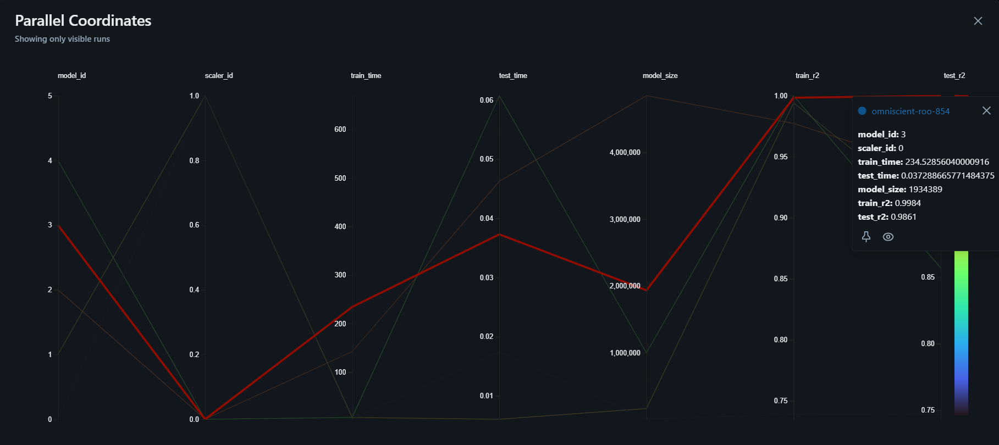

## Highlighted Run (Red Line):

- Model ID: 3
- Scaler ID: 0
- Training Time: ~234.53 seconds
- Testing Time: ~0.037 seconds
- Model Size: ~1.93 million parameters
- Train R² Score: 0.9984
- Test R² Score: 0.9861
## Key Insights
- The selected model achieves excellent predictive performance, with both Train R² and Test R² close to 1.0.
It has a moderate training time compared to other runs.
The testing time is very low, indicating fast predictions.
The model size is medium-sized, balancing complexity and efficiency.
The small gap between Train R² (0.9984) and Test R² (0.9861) suggests good generalization with minimal overfitting.
## Conclusion
- The highlighted model (Model 3) appears to be one of the best-performing models, offering a strong balance between accuracy, model size, and execution time. It is a suitable candidate for deployment due to its high Test R² and fast inference speed.

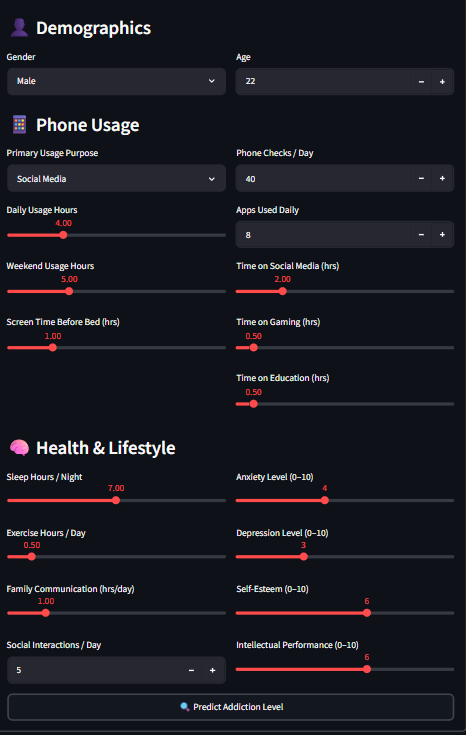

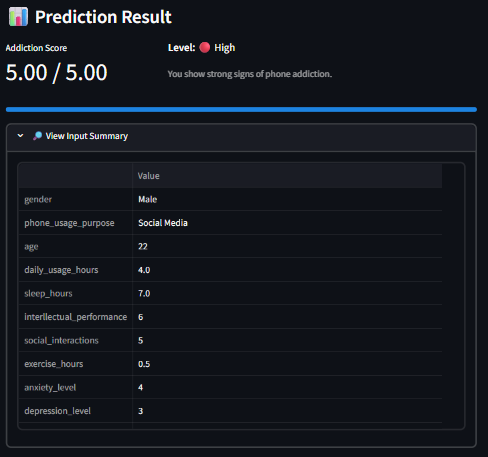

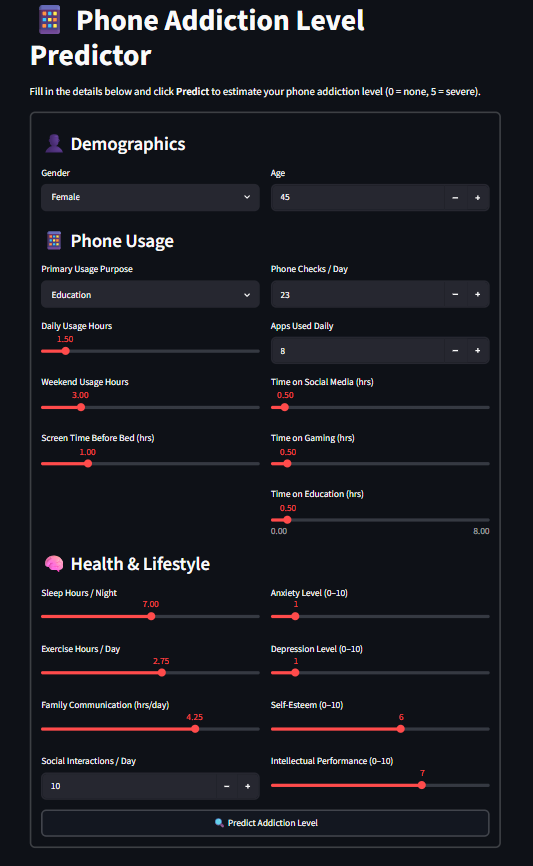

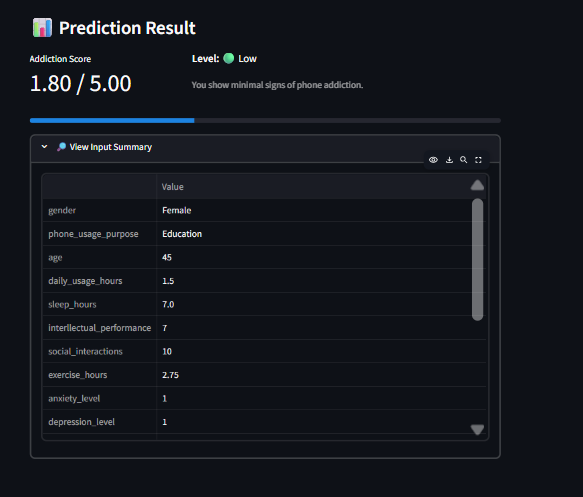

# streamlit
https://csqdnnhpdbvqgw58yjs62q.streamlit.app/
# Github
https://github.com/abhinayaa1289/phone